<a href="https://colab.research.google.com/github/ujwal05deep/HR-STRATEGY-for-Employee/blob/main/Attrition_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
**About this file
This dataset provides a detailed examination of employee attrition and its contributing factors, providing a robust set of quantitative and qualitative data

1.Age: The age of the employee. (Numerical)
2.Attrition: Whether or not the employee has left the organization. (Categorical)
3.BusinessTravel: The frequency of business travel for the employee. (Categorical)
4.DailyRate: The daily rate of pay for the employee. (Numerical)
5.Department: The department the employee works in. (Categorical)
6.DistanceFromHome: The distance from home in miles for the employee. (Numerical)
7.Education: The level of education achieved by the employee. (Categorical)
8.EducationField: The field of study for the employee's education. (Categorical)
9.EmployeeCount: The total number of employees in the organization. (Numerical)
10.EmployeeNumber: A unique identifier for each employee profile. (Numerical)
11.EnvironmentSatisfaction: The employee's satisfaction with their work environment. (Categorical)
12.Gender: The gender of the employee. (Categorical)
13.HourlyRate: The hourly rate of pay for the employee. (Numerical)
14.JobInvolvement: The level of involvement required for the employee's job. (Categorical)
15.JobLevel: The job level of the employee. (Categorical)
16.JobRole: The role of the employee in the organization. (Categorical)
17.JobSatisfaction: The employee's satisfaction with their job. (Categorical)
18.MaritalStatus: The marital status of the employee. (Categorical)
19.MonthlyIncome: The monthly income of the employee. (Numerical)
20.MonthlyRate: The monthly rate of pay for the employee. (Numerical)
21.NumCompaniesWorked: The number of companies the employee has worked for. (Numerical)
22.Over18: Whether or not the employee is over 18. (Categorical)
23.OverTime: Whether or not the employee works overtime. (Categorical)
24.PercentSalaryHike: The percentage of salary hike for the employee. (Numerical)
25.PerformanceRating: The performance rating of the employee. (Categorical)
26.RelationshipSatisfaction: The employee's satisfaction with their relationships. (Categorical)
27.StandardHours: The standard hours of work for the employee. (Numerical)
28.StockOptionLevel: The stock option level of the employee. (Numerical)
29.TotalWorkingYears: The total number of years the employee has worked. (Numerical)
30.TrainingTimesLastYear: The number of times the employee was taken for training in the last year. (Numerical)
31.WorkLifeBalance: The employee's perception of their work-life balance. (Categorical)
32.YearsAtCompany: The number of years the employee has been with the company. (Numerical)
33.YearsInCurrentRole: The number of years the employee has been in their current role. (Numerical)
34.YearsSinceLastPromotion: The number of years since the employee's last promotion. (Numerical)
35.YearsWithCurrManager: The number of years the employee has been with their current manager. (Numerical)

**bold text**

In [ ]:
#import all neccessary libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn
import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.ensemble import VotingClassifier
from sklearn import model_selection
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier,GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report



In [ ]:
df=pd.read_csv("HR_Analytics.csv.csv")    #read .csv file
df.head()                                 #display first 5 entries

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [ ]:
df.tail() #display last 5 entries

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,...,1,80,0,6,3,4,4,3,1,2


In [ ]:
df.size   #total entries

51450

In [ ]:
df.shape    #no. of rows and cols

(1470, 35)

In [ ]:
df.info()  #display total no. of rows,cols, dtypes,null values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [ ]:
df.describe()   #provides all statistical info

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [ ]:
df.isna().sum()    #no null value present,or no missing value

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [ ]:
#no Duplicate value present
df_duplicate_val=df[df.duplicated()]   #duplicate value
df_duplicate_val.count()               #counts duplicate val

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [ ]:
corr=df.corr() #correlation between columns
corr

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,0.010661,-0.001686,0.208034,NaN,-0.010145,0.010146,0.024287,0.029820,0.509604,...,0.053535,NaN,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
DailyRate,0.010661,1.000000,-0.004985,-0.016806,NaN,-0.050990,0.018355,0.023381,0.046135,0.002966,...,0.007846,NaN,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
DistanceFromHome,-0.001686,-0.004985,1.000000,0.021042,NaN,0.032916,-0.016075,0.031131,0.008783,0.005303,...,0.006557,NaN,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.016806,0.021042,1.000000,NaN,0.042070,-0.027128,0.016775,0.042438,0.101589,...,-0.009118,NaN,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EmployeeCount,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EmployeeNumber,-0.010145,-0.050990,0.032916,0.042070,NaN,1.000000,0.017621,0.035179,-0.006888,-0.018519,...,-0.069861,NaN,0.062227,-0.014365,0.023603,0.010309,-0.011240,-0.008416,-0.009019,-0.009197
EnvironmentSatisfaction,0.010146,0.018355,-0.016075,-0.027128,NaN,0.017621,1.000000,-0.049857,-0.008278,0.001212,...,0.007665,NaN,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999
HourlyRate,0.024287,0.023381,0.031131,0.016775,NaN,0.035179,-0.049857,1.000000,0.042861,-0.027853,...,0.001330,NaN,0.050263,-0.002334,-0.008548,-0.004607,-0.019582,-0.024106,-0.026716,-0.020123
JobInvolvement,0.029820,0.046135,0.008783,0.042438,NaN,-0.006888,-0.008278,0.042861,1.000000,-0.012630,...,0.034297,NaN,0.021523,-0.005533,-0.015338,-0.014617,-0.021355,0.008717,-0.024184,0.025976
JobLevel,0.509604,0.002966,0.005303,0.101589,NaN,-0.018519,0.001212,-0.027853,-0.012630,1.000000,...,0.021642,NaN,0.013984,0.782208,-0.018191,0.037818,0.534739,0.389447,0.353885,0.375281


In [ ]:
df.drop(["EmployeeCount","Over18","StandardHours"],axis=1,inplace=True)  #drop the cols that r not neccesary

In [ ]:
corr=df.corr()
corr

,Age,DailyRate,DistanceFromHome,Education,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,0.010661,-0.001686,0.208034,-0.010145,0.010146,0.024287,0.029820,0.509604,-0.004892,...,0.001904,0.053535,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
DailyRate,0.010661,1.000000,-0.004985,-0.016806,-0.050990,0.018355,0.023381,0.046135,0.002966,0.030571,...,0.000473,0.007846,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
DistanceFromHome,-0.001686,-0.004985,1.000000,0.021042,0.032916,-0.016075,0.031131,0.008783,0.005303,-0.003669,...,0.027110,0.006557,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.016806,0.021042,1.000000,0.042070,-0.027128,0.016775,0.042438,0.101589,-0.011296,...,-0.024539,-0.009118,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EmployeeNumber,-0.010145,-0.050990,0.032916,0.042070,1.000000,0.017621,0.035179,-0.006888,-0.018519,-0.046247,...,-0.020359,-0.069861,0.062227,-0.014365,0.023603,0.010309,-0.011240,-0.008416,-0.009019,-0.009197
EnvironmentSatisfaction,0.010146,0.018355,-0.016075,-0.027128,0.017621,1.000000,-0.049857,-0.008278,0.001212,-0.006784,...,-0.029548,0.007665,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999
HourlyRate,0.024287,0.023381,0.031131,0.016775,0.035179,-0.049857,1.000000,0.042861,-0.027853,-0.071335,...,-0.002172,0.001330,0.050263,-0.002334,-0.008548,-0.004607,-0.019582,-0.024106,-0.026716,-0.020123
JobInvolvement,0.029820,0.046135,0.008783,0.042438,-0.006888,-0.008278,0.042861,1.000000,-0.012630,-0.021476,...,-0.029071,0.034297,0.021523,-0.005533,-0.015338,-0.014617,-0.021355,0.008717,-0.024184,0.025976
JobLevel,0.509604,0.002966,0.005303,0.101589,-0.018519,0.001212,-0.027853,-0.012630,1.000000,-0.001944,...,-0.021222,0.021642,0.013984,0.782208,-0.018191,0.037818,0.534739,0.389447,0.353885,0.375281
JobSatisfaction,-0.004892,0.030571,-0.003669,-0.011296,-0.046247,-0.006784,-0.071335,-0.021476,-0.001944,1.000000,...,0.002297,-0.012454,0.010690,-0.020185,-0.005779,-0.019459,-0.003803,-0.002305,-0.018214,-0.027656


In [ ]:
df["StockOptionLevel"].value_counts()

0    631
1    596
2    158
3     85
Name: StockOptionLevel, dtype: int64

<Axes: xlabel='StockOptionLevel', ylabel='count'>

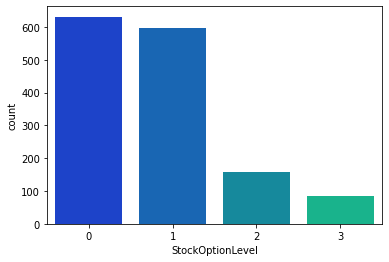

In [ ]:
sn.countplot(data=df,x="StockOptionLevel",palette="winter")

In [ ]:
df["Attrition"].value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

<Axes: xlabel='Attrition', ylabel='count'>

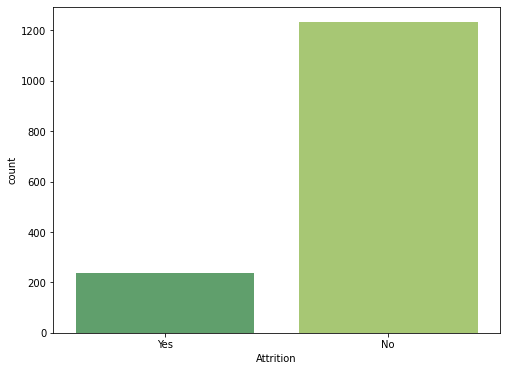

In [ ]:
plt.rcParams["figure.figsize"] = 8 , 6
sn.countplot(data=df,x="Attrition",palette="summer")

<Axes: xlabel='Gender', ylabel='count'>

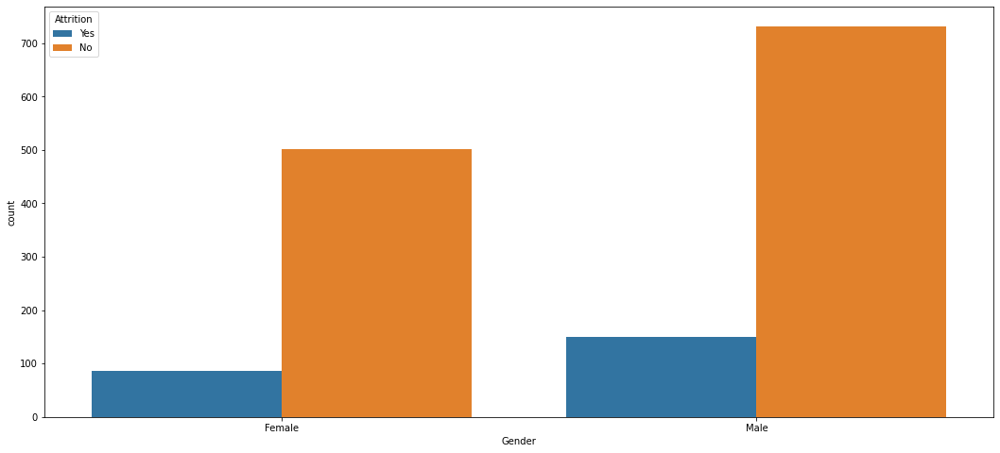

In [ ]:
plt.figure(figsize=(18,8))
sn.countplot(data=df,x="Gender",hue="Attrition")    #genderwise attrition

<Axes: xlabel='Age', ylabel='count'>

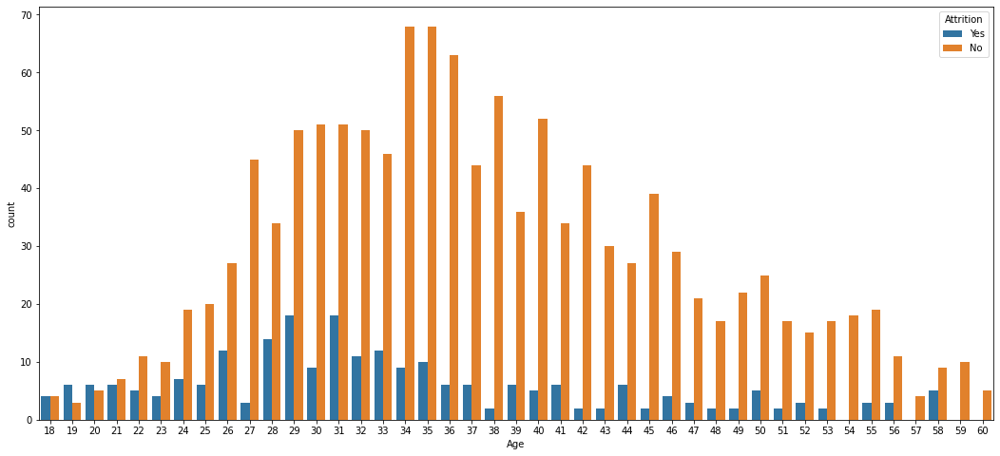

In [ ]:
plt.figure(figsize=(18,8))
sn.countplot(data=df,x="Age",hue="Attrition")  #age wise attrition count

According to age consideration ages between 29 to 31 having more attrition rate.

In [ ]:
df["PercentSalaryHike"].value_counts()

11    210
13    209
14    201
12    198
15    101
18     89
17     82
16     78
19     76
22     56
20     55
21     48
23     28
24     21
25     18
Name: PercentSalaryHike, dtype: int64

<Axes: xlabel='PercentSalaryHike', ylabel='count'>

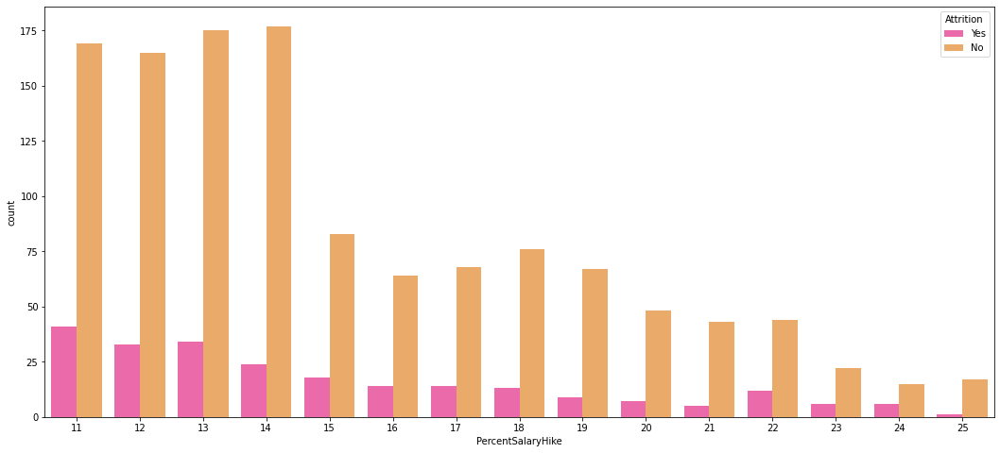

In [ ]:
plt.figure(figsize=(18,8))
sn.countplot(data=df,x="PercentSalaryHike",hue="Attrition",palette="spring")  #age wise attrition count

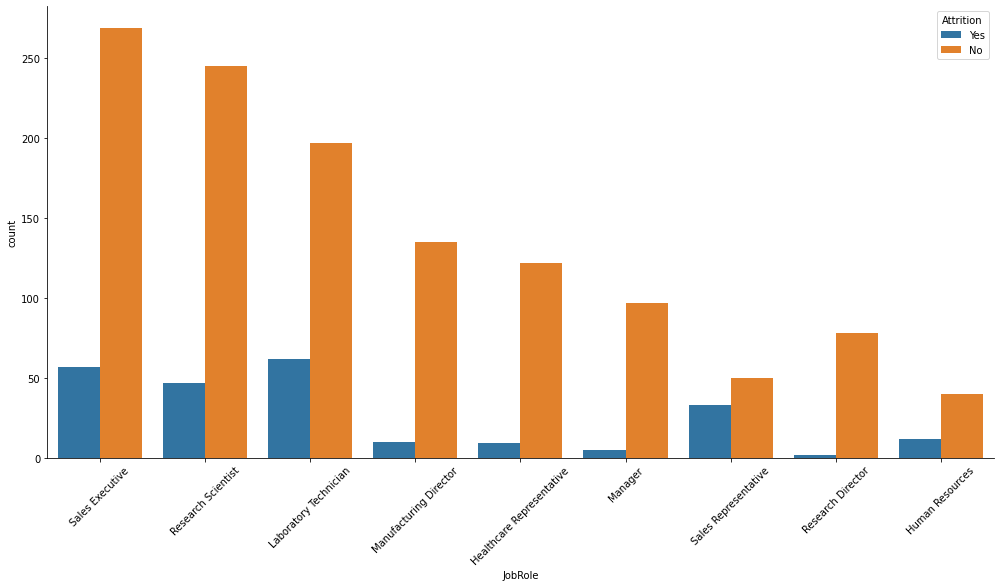

In [ ]:
#JobRoletwise attrition
sn.catplot(x="JobRole",hue="Attrition",data=df,kind="count",height=7,aspect=2,legend=False)
plt.legend(loc='upper right',title='Attrition')
plt.xticks(rotation=45)
plt.show()

Here Sales Executive,Laboratory Technician,sales Representative deapartment having high attrition.

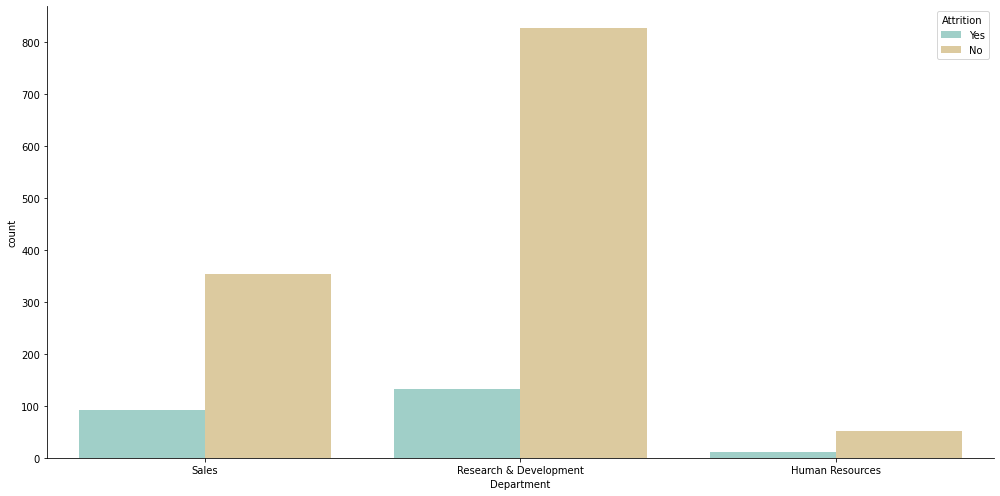

In [ ]:
#departmentwise attrition
sn.catplot(x="Department",hue="Attrition",data=df,kind="count",height=7,aspect=2,legend=False,palette="BrBG_r")
plt.legend(loc='upper right',title='Attrition')
plt.show()

Sales Department having high attrition rate.

<Axes: ylabel='WorkLifeBalance'>

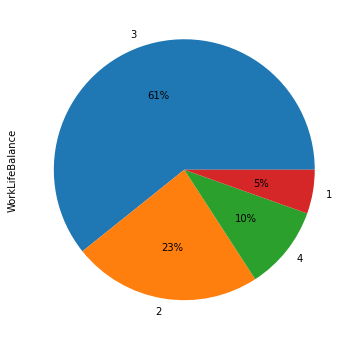

In [ ]:
df['WorkLifeBalance'].value_counts().plot(kind="pie",autopct="%.0f%%")

<Axes: ylabel='MaritalStatus'>

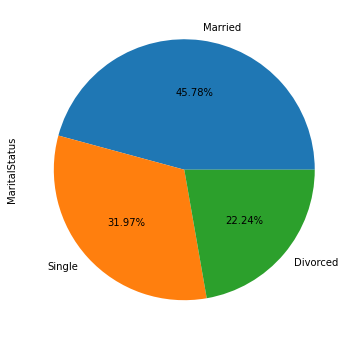

In [ ]:
df['MaritalStatus'].value_counts().plot(kind="pie",autopct="%.02f%%")

<Axes: xlabel='PercentSalaryHike', ylabel='Density'>

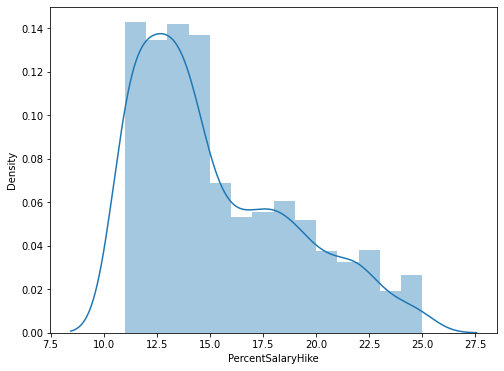

In [ ]:
sn.distplot(df["PercentSalaryHike"])

<Axes: title={'center': 'Attrition by Gender and Job Role'}, xlabel='Gender', ylabel='count'>

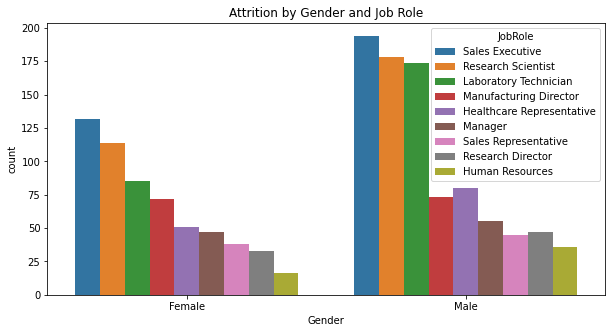

In [ ]:
plt.figure(figsize = (10,5))

plt.title("Attrition by Gender and Job Role")
sn.countplot(x = 'Gender', hue = 'JobRole', data = df)

Attrition levels are highest among men performing jobs as Sales Executives, Laboratory Technicians and Research Scientists. 
For women, attrition is highest at the Sales Executive level. Men and women are less likely to quit the Research Director 
or Manager job role.

In [ ]:
df["BusinessTravel"].value_counts()

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64

<Axes: title={'center': 'Attrition by Business Travel and Environment Satisfaction'}, xlabel='BusinessTravel', ylabel='count'>

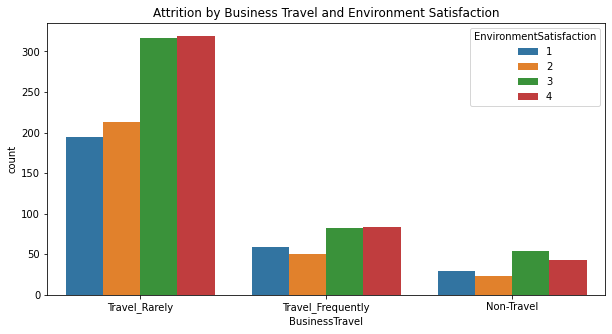

In [ ]:
plt.figure(figsize = (10,5))

plt.title("Attrition by Business Travel and Environment Satisfaction")
sn.countplot(x = 'BusinessTravel', hue = 'EnvironmentSatisfaction', data = df)

In [ ]:
catcol=df.select_dtypes(object).columns

In [ ]:
oe=OrdinalEncoder()
df[catcol]=oe.fit_transform(df[catcol])   #convert object column to numeric column

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 32 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       1470 non-null   int64  
 1   Attrition                 1470 non-null   float64
 2   BusinessTravel            1470 non-null   float64
 3   DailyRate                 1470 non-null   int64  
 4   Department                1470 non-null   float64
 5   DistanceFromHome          1470 non-null   int64  
 6   Education                 1470 non-null   int64  
 7   EducationField            1470 non-null   float64
 8   EmployeeNumber            1470 non-null   int64  
 9   EnvironmentSatisfaction   1470 non-null   int64  
 10  Gender                    1470 non-null   float64
 11  HourlyRate                1470 non-null   int64  
 12  JobInvolvement            1470 non-null   int64  
 13  JobLevel                  1470 non-null   int64  
 14  JobRole 

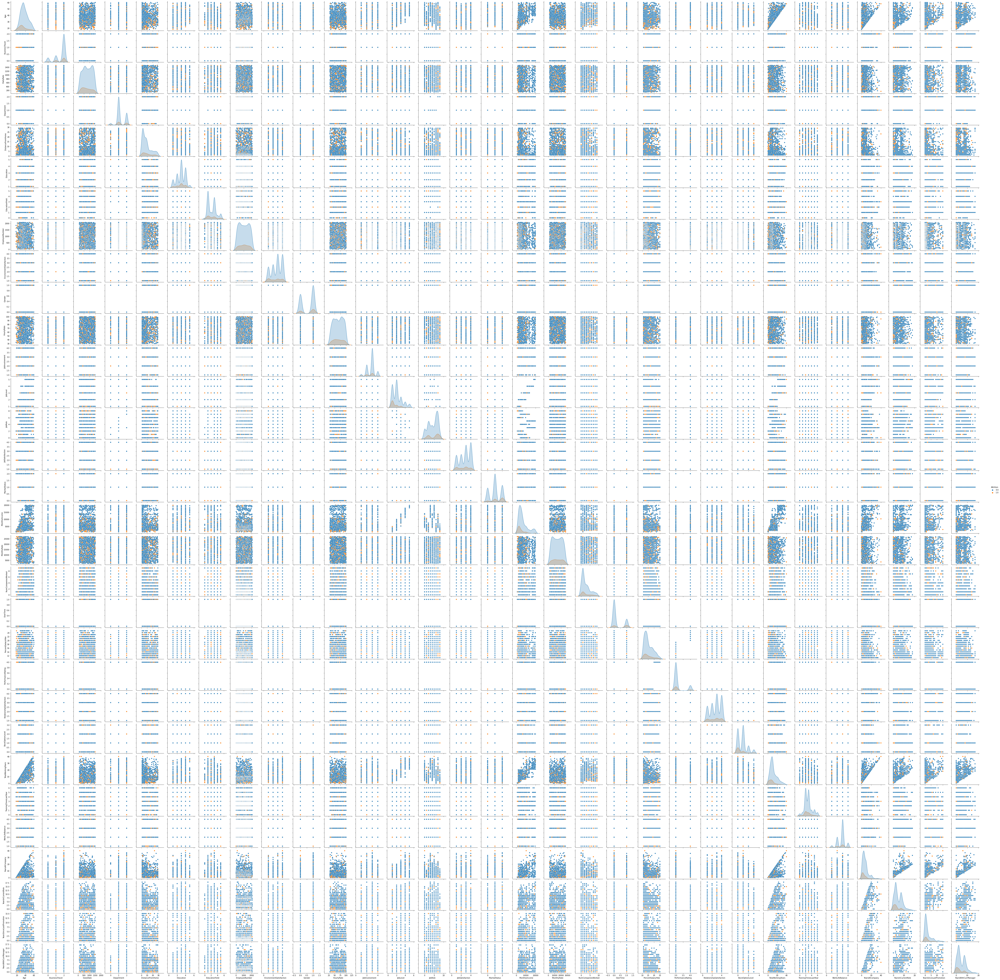

In [ ]:
sn.pairplot(data=df,hue="Attrition")

In [ ]:
# Train and test data

In [ ]:
# Splitting the DataFrame into predictor variables and target variable

x = df.drop('Attrition',axis=1)

# Load the target variable to y

y=df['Attrition']

In [ ]:
xtrain, xtest, ytrain, ytest = train_test_split(x,y, test_size=0.3, random_state=0)

In [ ]:
print(xtrain)
print(xtest)
print(ytrain) 
print(ytest)

      Age  BusinessTravel  DailyRate  Department  DistanceFromHome  Education  \
338    30             2.0        570         2.0                 5          3   
363    33             2.0        350         2.0                 5          3   
759    45             2.0        788         0.0                24          4   
793    28             2.0        895         1.0                15          2   
581    30             2.0        921         1.0                 1          3   
...   ...             ...        ...         ...               ...        ...   
763    34             2.0       1333         2.0                10          4   
835    35             2.0        528         0.0                 8          4   
1216   43             2.0       1179         2.0                 2          3   
559    38             2.0        268         1.0                 2          5   
684    40             2.0        658         2.0                10          4   

      EducationField  Emplo

In [ ]:
logistic_regression= LogisticRegression() #obj(model)=classname()
logistic_regression.fit(xtrain,ytrain)#training model(calculation)


LogisticRegression()

In [ ]:
ypred=logistic_regression.predict(xtest)

print (xtest) #test dataset
print (ypred) #predicted values

      Age  BusinessTravel  DailyRate  Department  DistanceFromHome  Education  \
442    36             0.0        635         2.0                10          4   
1091   33             2.0        575         1.0                25          3   
981    35             1.0        662         2.0                18          4   
785    40             2.0       1492         1.0                20          4   
1332   29             1.0        459         1.0                24          2   
...   ...             ...        ...         ...               ...        ...   
817    36             0.0        217         1.0                18          4   
399    31             2.0        329         1.0                 1          2   
458    40             0.0       1094         2.0                28          3   
406    52             2.0        319         1.0                 3          3   
590    33             2.0        213         1.0                 7          3   

      EducationField  Emplo

In [ ]:
print(ytest)#actual y

442     0.0
1091    0.0
981     1.0
785     0.0
1332    1.0
       ... 
817     0.0
399     0.0
458     0.0
406     0.0
590     0.0
Name: Attrition, Length: 441, dtype: float64


In [ ]:
logistic_regression.score(xtest,ytest)

0.8458049886621315

In [ ]:
logistic_regression.score(xtrain,ytrain)

0.8406219630709426

In [ ]:
#Classification
ac=accuracy_score(ytest,ypred)
cm=confusion_matrix(ytest,ypred)
cr=classification_report(ytest,ypred)


In [ ]:
print(ac)
print(cm)
print(cr)

0.8458049886621315
[[371   0]
 [ 68   2]]
              precision    recall  f1-score   support

         0.0       0.85      1.00      0.92       371
         1.0       1.00      0.03      0.06        70

    accuracy                           0.85       441
   macro avg       0.92      0.51      0.49       441
weighted avg       0.87      0.85      0.78       441



In [ ]:
#SVM  -SVC classification

from sklearn.svm import SVC


In [ ]:
svm=SVC(kernel="linear")    #we can put kernel=linear,sigmoid,poly

In [ ]:
svm.fit(xtrain,ytrain)
ypred=svm.predict(xtest)

In [ ]:
svm.score(xtrain,ytrain)

0.8503401360544217

In [ ]:
svm.score(xtest,ytest)

0.8480725623582767

In [ ]:
from sklearn.ensemble import VotingClassifier

In [ ]:
models=[]
accuracy=[]

models.append(("logreg",LogisticRegression()))
models.append(("DT",DecisionTreeClassifier()))
models.append(("DT-e",DecisionTreeClassifier(criterion="entropy")))
models

[('logreg', LogisticRegression()),
 ('DT', DecisionTreeClassifier()),
 ('DT-e', DecisionTreeClassifier(criterion='entropy'))]

In [ ]:
for name,model in models:
    model.fit(xtrain,ytrain)
    ypred=model.predict(xtest)
    ac=accuracy_score(ytest,ypred)
    accuracy.append(ac)

In [ ]:
accuracy

[0.8458049886621315, 0.7891156462585034, 0.8095238095238095]

In [ ]:
arr=np.array(accuracy)
print("average accuracy",arr.mean())

average accuracy 0.8148148148148149


In [ ]:
vc=VotingClassifier(estimators=models)
vc.fit(xtrain,ytrain)
ypred=vc.predict(xtest)

In [ ]:
train=vc.score(xtrain,ytrain)
test=vc.score(xtest,ytest)

print("training accuracy",train)
print("testing accuracy",test)
print(classification_report(ytest,ypred))

training accuracy 1.0
testing accuracy 0.8390022675736961
              precision    recall  f1-score   support

         0.0       0.86      0.96      0.91       371
         1.0       0.48      0.20      0.28        70

    accuracy                           0.84       441
   macro avg       0.67      0.58      0.60       441
weighted avg       0.80      0.84      0.81       441



In [ ]:
from sklearn.ensemble import AdaBoostClassifier,GradientBoostingClassifier

In [ ]:
mymodel(AdaBoostClassifier())

              precision    recall  f1-score   support

         0.0       0.90      0.96      0.93       371
         1.0       0.64      0.41      0.50        70

    accuracy                           0.87       441
   macro avg       0.77      0.69      0.72       441
weighted avg       0.86      0.87      0.86       441



AdaBoostClassifier()

In [ ]:
mymodel(GradientBoostingClassifier())

              precision    recall  f1-score   support

         0.0       0.89      0.98      0.93       371
         1.0       0.74      0.33      0.46        70

    accuracy                           0.88       441
   macro avg       0.81      0.65      0.69       441
weighted avg       0.86      0.88      0.85       441



GradientBoostingClassifier()

In [ ]:
from xgboost import XGBClassifier

In [ ]:
mymodel(XGBClassifier(max_depth=2))

              precision    recall  f1-score   support

         0.0       0.88      0.97      0.93       371
         1.0       0.68      0.33      0.44        70

    accuracy                           0.87       441
   macro avg       0.78      0.65      0.68       441
weighted avg       0.85      0.87      0.85       441



XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=2, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

We checked cross verification for number of classification,having good accuracy but,
In all above classification GradientBoostingClassifier has more accuracy